# Import package

In [57]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
import re
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.util import ngrams
stopwords = stopwords.words('english')
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfTransformer, TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,plot_confusion_matrix
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [2]:
!pip install kaggle
!pip install nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ridwanakmal","key":"d47613ff7b8c36d503860ad5aa867027"}'}

In [4]:
!mkdir -p ~/.kaggle                                               
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d clmentbisaillon/fake-and-real-news-dataset
!unzip '/content/fake-and-real-news-dataset.zip' -d '/content/fakerealnews'

 61% 25.0M/41.0M [00:00<00:00, 105MB/s] 
100% 41.0M/41.0M [00:00<00:00, 120MB/s]
Archive:  /content/fake-and-real-news-dataset.zip
  inflating: /content/fakerealnews/Fake.csv  
  inflating: /content/fakerealnews/True.csv  


In [6]:
df_fake = pd.read_csv('/content/fakerealnews/Fake.csv')
df_real = pd.read_csv('/content/fakerealnews/True.csv')

# Explore the fake news

In [7]:
df_fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [8]:
# see the distribution of fake news subject
df_fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

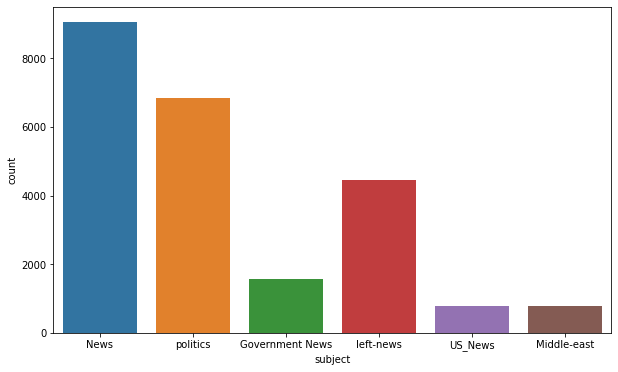

In [9]:
# visualization distribution fake news subject
plt.figure(figsize=(10,6))
sns.countplot("subject", data=df_fake)

## seperate data into a different subject news(fake)

In [10]:
set(df_fake.subject)

{'Government News', 'Middle-east', 'News', 'US_News', 'left-news', 'politics'}

In [11]:
Government_News = df_fake[df_fake['subject']=="Government News"]
Middle_east_News = df_fake[df_fake['subject']=="Middle-east"]
left_News = df_fake[df_fake['subject']=="left-news"]
News = df_fake[df_fake['subject']=="News"]
US_News = df_fake[df_fake['subject']=="US_News"]
Politics_News = df_fake[df_fake['subject']=="politics"]

In [12]:
print(Government_News.shape)
print(Middle_east_News.shape)
print(left_News.shape)
print(News.shape)
print(US_News.shape)
print(Politics_News.shape)

(1570, 4)
(778, 4)
(4459, 4)
(9050, 4)
(783, 4)
(6841, 4)


# Explore the real news

In [13]:
df_real.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [14]:
# see the distribution of real news subject
df_real['subject'].value_counts()

politicsNews    11272
worldnews       10145
Name: subject, dtype: int64

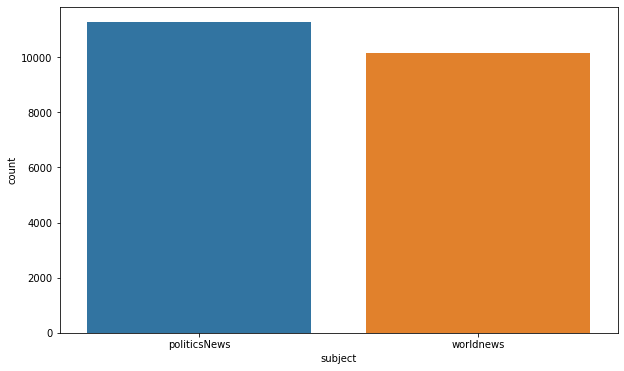

In [15]:
# visualization distribution fake news subject
plt.figure(figsize=(10,6))
sns.countplot("subject", data=df_real)

## seperate data into a different subject news(real)

In [16]:
politics = df_real[df_real['subject']=="politicsNews"]
world = df_real[df_real['subject']=="worldnews"]

In [17]:
print(politics.shape)
print(world.shape)

(11272, 4)
(10145, 4)


# Text Preprocessing(real news)

## Removing punctuation

In [18]:
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [19]:
#defining the function to remove punctuation
def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree

In [20]:
politics['text'] = politics['text'].apply(remove_punctuation)
world['text'] = world['text'].apply(remove_punctuation)

## Removing stopwords and tokenizing

In [21]:
def tokenizeandstopwords(text):
    tokens = nltk.word_tokenize(text)
    # taken only words (not punctuation)
    token_words = [w for w in tokens if w.isalpha()]
    meaningful_words = [w for w in token_words if not w in stopwords]
    joined_words = ( " ".join(meaningful_words))
    return joined_words

In [22]:
politics['text'] = politics['text'].apply(tokenizeandstopwords)
world['text'] = world['text'].apply(tokenizeandstopwords)

# Text Preprocessing(fake news)

## Removing punctuation

In [23]:
#defining the function to remove punctuation
def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree

In [24]:
Government_News['text'] = Government_News['text'].apply(remove_punctuation)
Middle_east_News['text'] = Middle_east_News['text'].apply(remove_punctuation)
left_News['text'] = left_News['text'].apply(remove_punctuation)
News['text'] = News['text'].apply(remove_punctuation)
US_News['text'] = US_News['text'].apply(remove_punctuation)
Politics_News['text'] = Politics_News['text'].apply(remove_punctuation)

## Removing stopwords and tokenizing

In [25]:
def tokenizeandstopwords(text):
    tokens = nltk.word_tokenize(text)
    # taken only words (not punctuation)
    token_words = [w for w in tokens if w.isalpha()]
    meaningful_words = [w for w in token_words if not w in stopwords]
    joined_words = ( " ".join(meaningful_words))
    return joined_words

In [26]:
Government_News['text'] = Government_News['text'].apply(tokenizeandstopwords)
Middle_east_News['text'] = Middle_east_News['text'].apply(tokenizeandstopwords)
left_News['text'] = left_News['text'].apply(tokenizeandstopwords)
News['text'] = News['text'].apply(tokenizeandstopwords)
US_News['text'] = US_News['text'].apply(tokenizeandstopwords)
Politics_News['text'] = Politics_News['text'].apply(tokenizeandstopwords)

# Visualize wordcloud

In [27]:
def generate_word_cloud(text):
    wordcloud = WordCloud(
        width = 3000,
        height = 2000,
        background_color = 'black').generate(str(text))
    fig = plt.figure(
        figsize = (40, 30),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

## Politic text(real news)

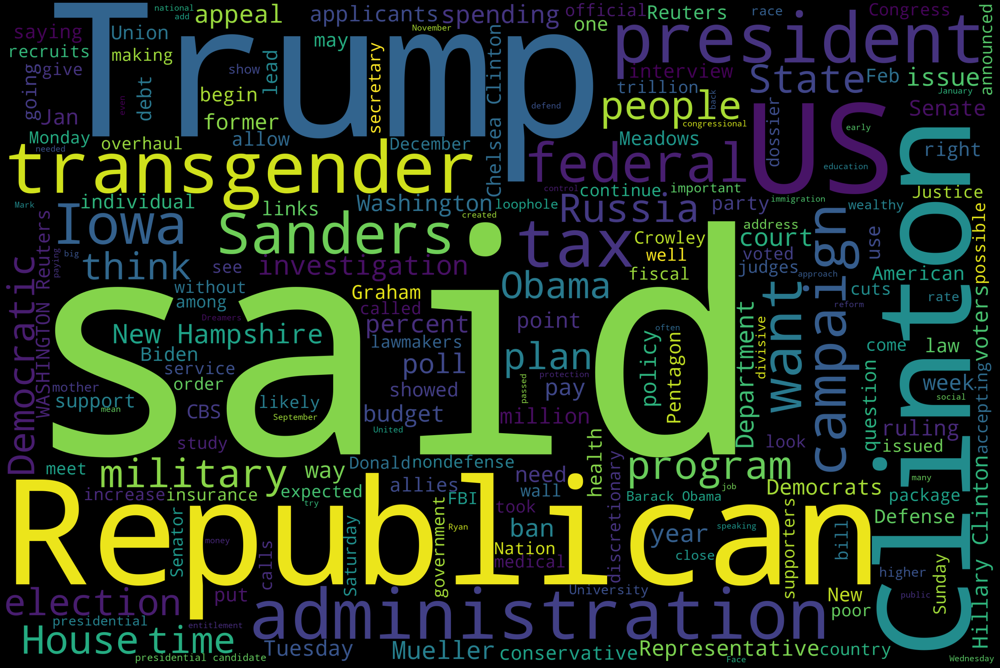

In [28]:
politics_text = politics.text.values
generate_word_cloud(politics_text)

## Worldnews text(real news)

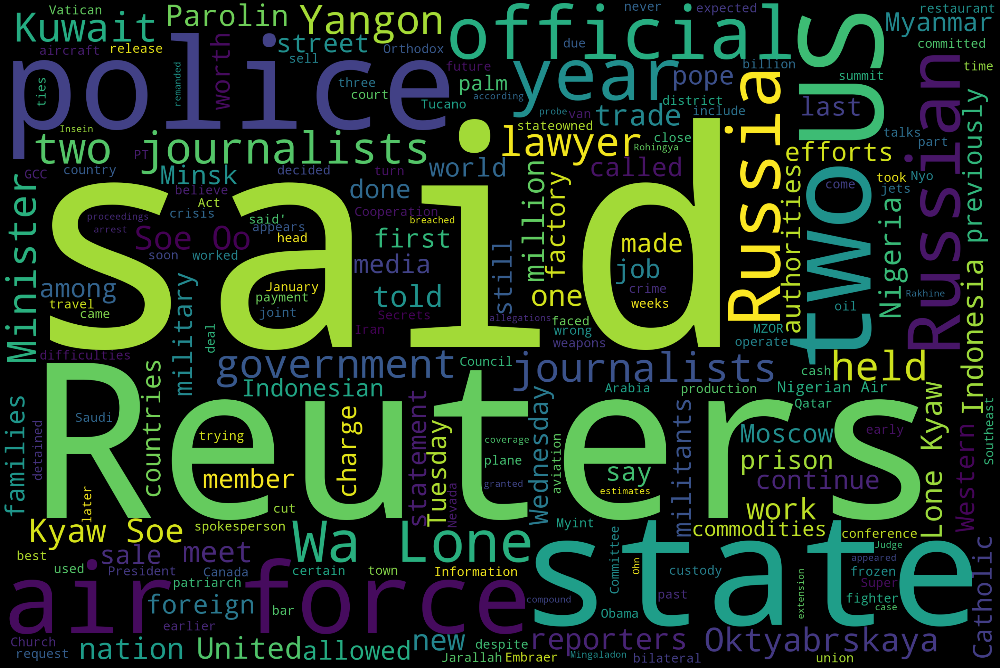

In [29]:
world_text = world.text.values
generate_word_cloud(world_text)

## Government text(fake news)

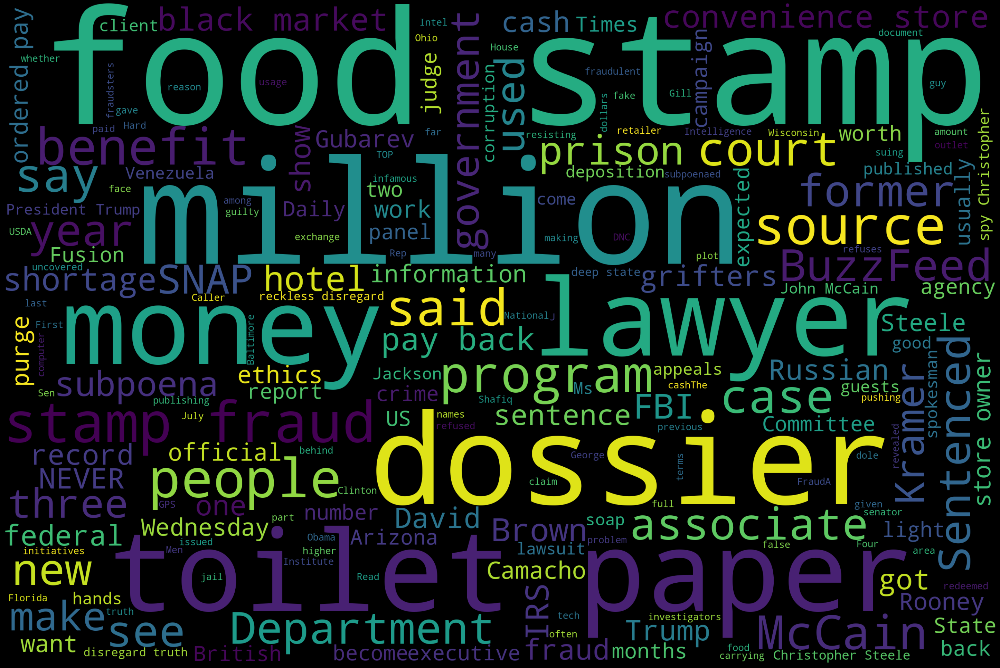

In [30]:
Government_text = Government_News.text.values
generate_word_cloud(Government_text)

## middle east text(fake news)

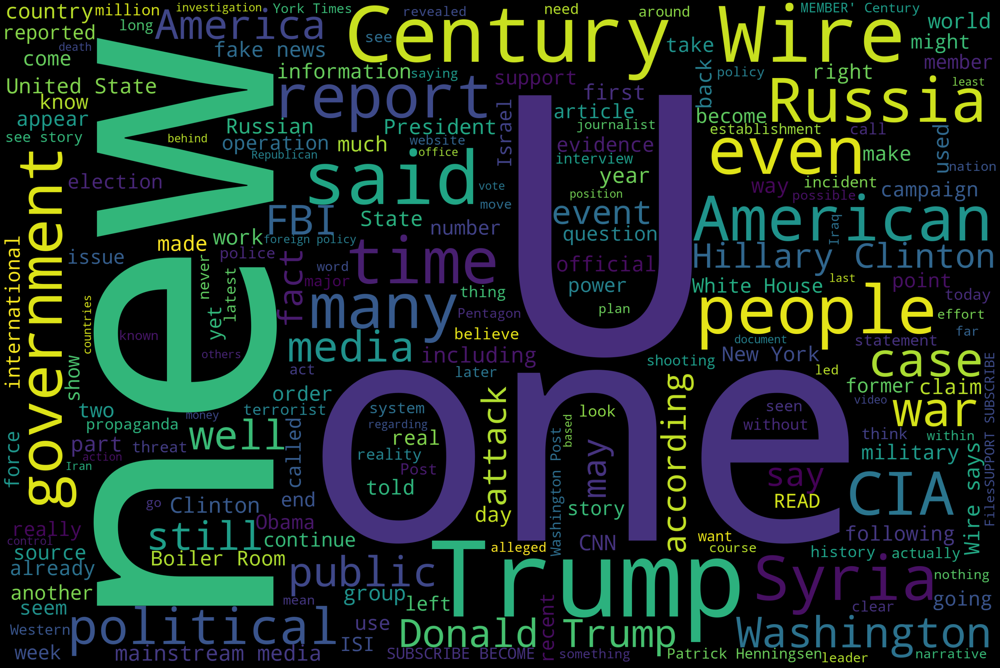

In [31]:
mideast_text = Middle_east_News.text.values
generate_word_cloud(mideast_text)

## News text(fake news)

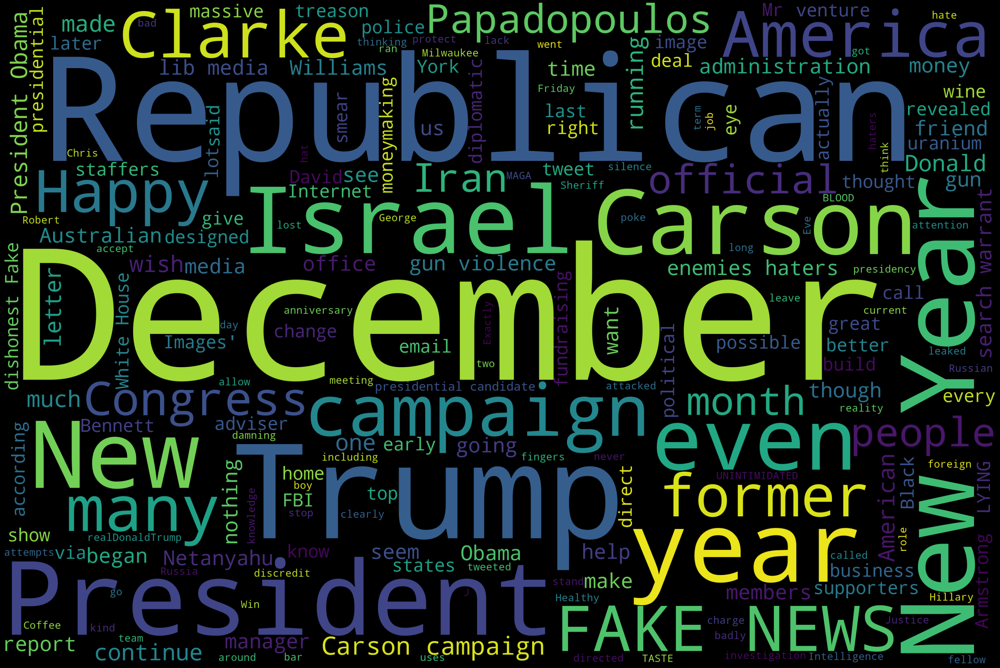

In [32]:
news_text = News.text.values
generate_word_cloud(news_text)

## left text(fake news)

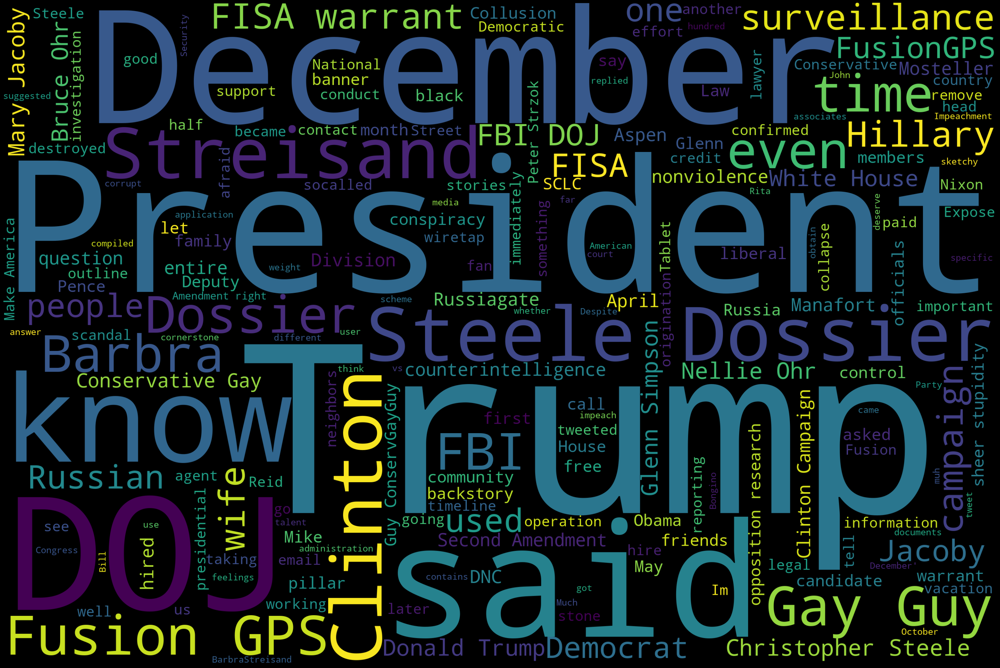

In [33]:
left_text = left_News.text.values
generate_word_cloud(left_text)

## US text(fake news)

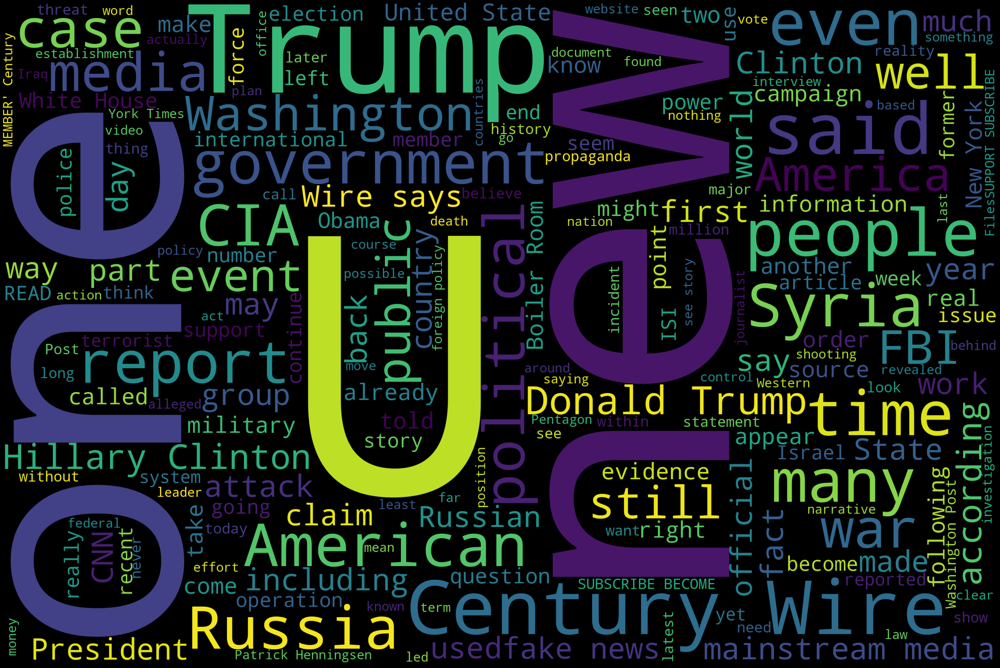

In [34]:
usNews_text = US_News.text.values
generate_word_cloud(usNews_text)

## Politic text(fake news)

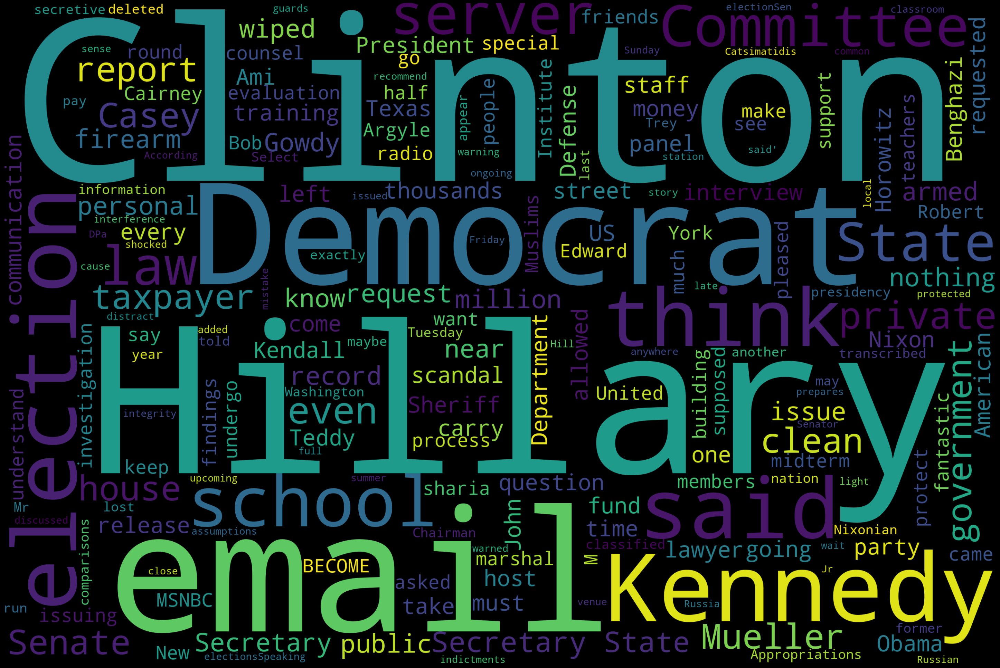

In [35]:
politic_text = Politics_News.text.values
generate_word_cloud(politic_text)

# Merge the fake and real news

In [36]:
df_fake['target'] = 'fake'
df_real['target'] = 'real'
news = pd.concat([df_fake, df_real]).reset_index(drop = True)
news.head()

,title,text,subject,date,target
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",fake
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",fake
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",fake
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",fake
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",fake


In [37]:
news.shape

(44898, 5)

In [41]:
def basic_clean(text):
  wnl = nltk.stem.WordNetLemmatizer()
  words = re.sub(r'[^\w\s]', '', text).split()
  return [wnl.lemmatize(word) for word in words if word not in stopwords]

In [44]:
real_word = basic_clean(''.join(str(df_real['text'].tolist())))

# N-gram Analysis - Bigram and Trigram 

## Real news

In [45]:
real_bigrams_series = (pd.Series(nltk.ngrams(real_word, 2)).value_counts())[:20]

Text(0.5, 0, 'of Occurances')

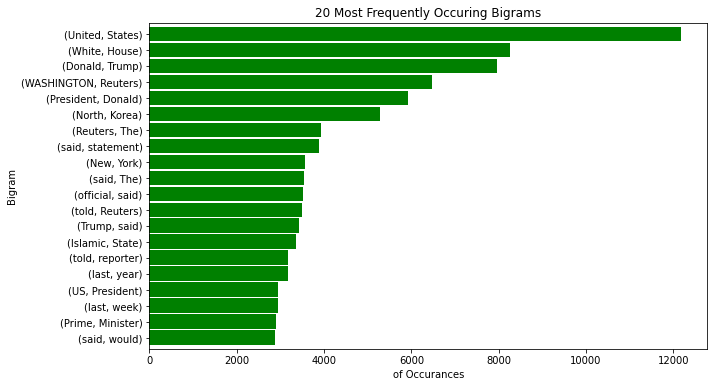

In [47]:
real_bigrams_series.sort_values().plot.barh(color='green', width=.9, figsize=(10, 6))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('of Occurances')

Text(0.5, 0, 'of Occurances')

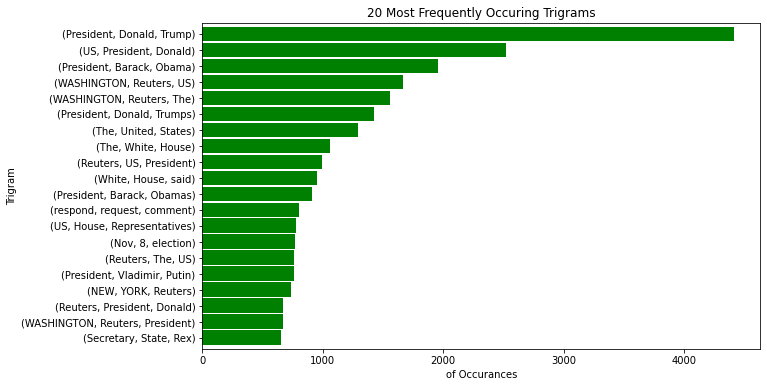

In [60]:
real_trigrams_series = (pd.Series(nltk.ngrams(real_word, 3)).value_counts())[:20]
real_trigrams_series.sort_values().plot.barh(color='green', width=.9, figsize=(10, 6))
plt.title('20 Most Frequently Occuring Trigrams')
plt.ylabel('Trigram')
plt.xlabel('of Occurances')

## Fake news

In [50]:
fake_word = basic_clean(''.join(str(df_fake['text'].tolist())))

Text(0.5, 0, 'of Occurances')

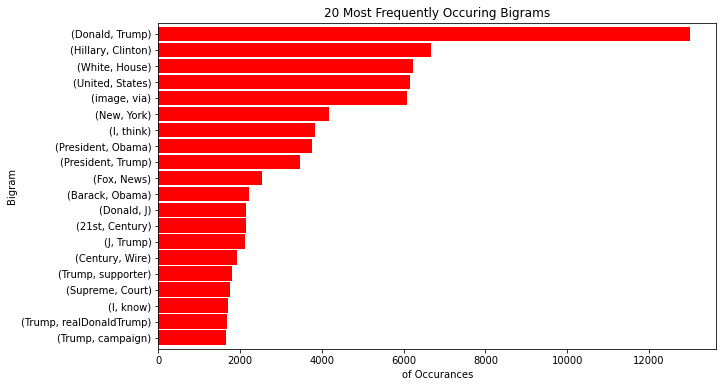

In [51]:
real_bigrams_series = (pd.Series(nltk.ngrams(fake_word, 2)).value_counts())[:20]
real_bigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(10, 6))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('of Occurances')

Text(0.5, 0, 'of Occurances')

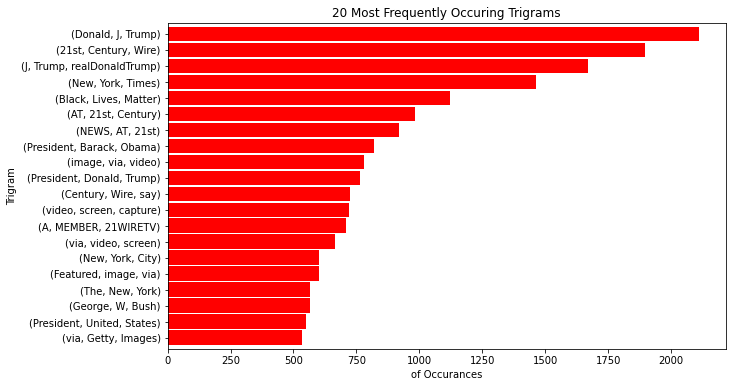

In [61]:
real_trigrams_series = (pd.Series(nltk.ngrams(fake_word, 3)).value_counts())[:20]
real_trigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(10, 6))
plt.title('20 Most Frequently Occuring Trigrams')
plt.ylabel('Trigram')
plt.xlabel('of Occurances')

# Build a model

In [56]:
x_train,x_test,y_train,y_test = train_test_split(news['text'], news.target, test_size=0.2, random_state=42)

pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', RandomForestClassifier())])

model = pipe.fit(x_train, y_train)
prediction = model.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))

accuracy: 98.83%


In [58]:
print(confusion_matrix(y_test, prediction))
print(classification_report(y_test, prediction))

[[4691   42]
 [  63 4184]]
              precision    recall  f1-score   support

        fake       0.99      0.99      0.99      4733
        real       0.99      0.99      0.99      4247

    accuracy                           0.99      8980
   macro avg       0.99      0.99      0.99      8980
weighted avg       0.99      0.99      0.99      8980



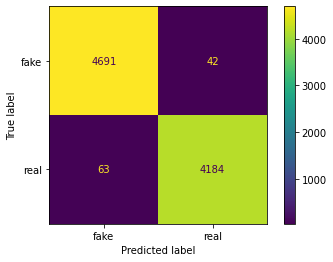

In [59]:
plot_confusion_matrix(model,x_test,y_test)